In [ ]:
!pip install ultralytics
!pip install tkinter opencv-python pillow ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 26.5 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement tkinter (from versions: none)
ERROR: No matching distribution found for tkinter


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO
import os
import shutil
import random
import glob

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!unzip train.zip
!unzip test.zip

Archive:  train.zip
 extracting: train/_darknet.labels   
  inflating: train/potholes0_png.rf.878da01a453cb0fdad4375edf3945631.jpg  
  inflating: train/potholes0_png.rf.878da01a453cb0fdad4375edf3945631.txt  
  inflating: train/potholes0_png.rf.c7c0dad17b8d208099e4c3dadeeacdfa.jpg  
  inflating: train/potholes0_png.rf.c7c0dad17b8d208099e4c3dadeeacdfa.txt  
  inflating: train/potholes0_png.rf.d387b15542504bcff25946f147ef3bae.jpg  
  inflating: train/potholes0_png.rf.d387b15542504bcff25946f147ef3bae.txt  
  inflating: train/potholes1_png.rf.2228853fff0b0e1f5dba7a4449189669.jpg  
  inflating: train/potholes1_png.rf.2228853fff0b0e1f5dba7a4449189669.txt  
  inflating: train/potholes1_png.rf.5dd52067de27c878d082b0d935d5a8f3.jpg  
  inflating: train/potholes1_png.rf.5dd52067de27c878d082b0d935d5a8f3.txt  
  inflating: train/potholes1_png.rf.7f91cc21dd9e846c5a053bde123f7b2d.jpg  
  inflating: train/potholes1_png.rf.7f91cc21dd9e846c5a053bde123f7b2d.txt  
  inflating: train/potholes10_png.rf.8ad73

In [ ]:
train_dataset_path = "/content/train"
test_dataset_path = "/content/test"

train_images_path = os.path.join(train_dataset_path, 'images/train')
train_labels_path = os.path.join(train_dataset_path, 'labels/train')

test_images_path = os.path.join(test_dataset_path, "images/test")
test_labels_path = os.path.join(test_dataset_path, "labels/test")

In [ ]:
os.makedirs(train_images_path, exist_ok = True)
os.makedirs(train_labels_path, exist_ok = True)

os.makedirs(test_images_path, exist_ok = True)
os.makedirs(test_labels_path, exist_ok = True)

In [ ]:
all_files_train = os.listdir(train_dataset_path)
all_files_test = os.listdir(test_dataset_path)
for file in all_files_train:
  if file.endswith(".jpg"):
    shutil.move(os.path.join(train_dataset_path, file), train_images_path)
  elif file.endswith(".txt"):
    shutil.move(os.path.join(train_dataset_path, file), train_labels_path)

for file in all_files_test:
  if file.endswith(".jpg"):
    shutil.move(os.path.join(test_dataset_path, file), test_images_path)
  elif file.endswith(".txt"):
    shutil.move(os.path.join(test_dataset_path, file), test_labels_path)

In [ ]:
print("Train Images" ,os.listdir(train_images_path))
print("Test Images", os.listdir(test_images_path))

Train Images ['potholes465_png.rf.0eba0796ab432ab38cad7f13f5e849f4.jpg', 'potholes488_png.rf.533d90a63e28057537ffe0845b2ada17.jpg', 'potholes402_png.rf.e722f0247d699b5404da3aa38fa63e94.jpg', 'potholes5_png.rf.b847157e0cb4037ea93f610f6d880421.jpg', 'potholes35_png.rf.bc846e099ecf7c9453aff705470b135f.jpg', 'potholes18_png.rf.32d1beb3730ffa1d71729164df70d057.jpg', 'potholes18_png.rf.0130218507a835f7ffd5d8567ff8397b.jpg', 'potholes30_png.rf.fcea0d51747c00e2937c58854db98373.jpg', 'potholes446_png.rf.fbbf8606a7bc039a1ae3764af92db6f5.jpg', 'potholes538_png.rf.928654a9188539ff1d0a68f903df0be7.jpg', 'potholes231_png.rf.08829ce09eef7e7d9b35d544c8def18b.jpg', 'potholes606_png.rf.f89095ac843e746f74ef5930ae191169.jpg', 'potholes586_png.rf.ee087045349476df32682cbe786e332e.jpg', 'potholes422_png.rf.47c476cf0f1597ca6096daa0e4d1289d.jpg', 'potholes574_png.rf.bd33df4e51de92c512084fb5ef7ba7a2.jpg', 'potholes319_png.rf.d4a3e803740d059d0baf8523ed533c3a.jpg', 'potholes424_png.rf.021afcf4ab3f2302992be4090b32

In [ ]:
print("Train Images", len(os.listdir(train_images_path)))
print("Test Images", len(os.listdir(test_images_path)))

Train Images 1562
Test Images 421


In [ ]:
# Define the content of the data.yaml file
data_yaml_content = """
train: /content/train/images/train
val: /content/train/images/train

test: /content/test/images/test

nc: 1
names: ['pothole']
"""

# Write the content to a file
with open('/content/data.yaml', 'w') as file:
    file.write(data_yaml_content)


In [ ]:
!cat /content/data.yaml


train: /content/train/images/train
val: /content/train/images/train

test: /content/test/images/test

nc: 1
names: ['pothole']


In [ ]:
model = YOLO("yolov8n.pt")

100%|██████████| 6.25M/6.25M [00:00<00:00, 84.7MB/s]


In [ ]:
model.train(data = '/content/data.yaml',epochs = 50, imgsz = 640)

Ultralytics 8.3.11 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

100%|██████████| 755k/755k [00:00<00:00, 18.7MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 95.1MB/s]


AMP: checks passed ✅


train: Scanning /content/train/labels/train... 1562 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1562/1562 [00:00<00:00, 1962.27it/s]


train: New cache created: /content/train/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/train/labels/train.cache... 1562 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1562/1562 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.33G      1.712      2.625       1.65         62        640: 100%|██████████| 98/98 [00:34<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:16<00:00,  2.94it/s]


                   all       1562       4054      0.458      0.138      0.205     0.0903

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.33G      1.714      2.083      1.641         32        640: 100%|██████████| 98/98 [00:34<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


                   all       1562       4054       0.25      0.192       0.14     0.0526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.35G      1.704      1.911      1.652         67        640: 100%|██████████| 98/98 [00:30<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.53it/s]


                   all       1562       4054      0.548      0.426      0.445      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.34G      1.691      1.796      1.632         33        640: 100%|██████████| 98/98 [00:27<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.35it/s]


                   all       1562       4054      0.565      0.417      0.441      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.34G      1.691      1.735      1.638         48        640: 100%|██████████| 98/98 [00:30<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.20it/s]


                   all       1562       4054      0.583      0.564      0.573      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.33G      1.636       1.65      1.595         54        640: 100%|██████████| 98/98 [00:32<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


                   all       1562       4054      0.693      0.558      0.625      0.301

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.33G      1.631      1.619      1.588         52        640: 100%|██████████| 98/98 [00:30<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.62it/s]

                   all       1562       4054       0.64        0.5      0.585      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.32G      1.617      1.586      1.573         33        640: 100%|██████████| 98/98 [00:28<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.23it/s]

                   all       1562       4054      0.732      0.624      0.715      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.33G      1.573      1.472      1.548         43        640: 100%|██████████| 98/98 [00:30<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.23it/s]


                   all       1562       4054      0.704      0.598      0.672      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.33G      1.563      1.462      1.536         44        640: 100%|██████████| 98/98 [00:30<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.26it/s]

                   all       1562       4054      0.722      0.572      0.657      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       2.3G      1.555      1.442      1.537         42        640: 100%|██████████| 98/98 [00:32<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


                   all       1562       4054      0.725      0.658       0.73      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.33G      1.528      1.415      1.517         58        640: 100%|██████████| 98/98 [00:28<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.58it/s]


                   all       1562       4054      0.726      0.649       0.73      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.3G      1.504      1.377        1.5         35        640: 100%|██████████| 98/98 [00:30<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.30it/s]

                   all       1562       4054      0.762      0.646      0.739      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.32G      1.514      1.368      1.492         42        640: 100%|██████████| 98/98 [00:30<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.26it/s]

                   all       1562       4054       0.75      0.687      0.775      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.33G      1.466      1.311      1.459         31        640: 100%|██████████| 98/98 [00:31<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.16it/s]


                   all       1562       4054      0.754      0.695      0.761      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       2.3G       1.46      1.272      1.456         50        640: 100%|██████████| 98/98 [00:27<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.21it/s]

                   all       1562       4054      0.771      0.684      0.783      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.32G      1.448      1.241      1.459         35        640: 100%|██████████| 98/98 [00:30<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.27it/s]

                   all       1562       4054      0.756      0.689      0.781      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.32G      1.436      1.244      1.446         24        640: 100%|██████████| 98/98 [00:30<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.24it/s]

                   all       1562       4054      0.795      0.728      0.816      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.32G      1.432      1.236      1.437         39        640: 100%|██████████| 98/98 [00:29<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.51it/s]

                   all       1562       4054      0.777      0.693       0.78       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.31G      1.423      1.205      1.438         53        640: 100%|██████████| 98/98 [00:33<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.31it/s]

                   all       1562       4054      0.806      0.746      0.824      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50       2.3G      1.411      1.168      1.427         46        640: 100%|██████████| 98/98 [00:30<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.27it/s]

                   all       1562       4054      0.826       0.76      0.852      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.32G      1.395      1.165      1.421         41        640: 100%|██████████| 98/98 [00:30<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.29it/s]

                   all       1562       4054      0.833      0.779      0.868      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.34G      1.371      1.125      1.381         50        640: 100%|██████████| 98/98 [00:29<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.54it/s]

                   all       1562       4054      0.822      0.782      0.859      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.32G      1.369      1.134      1.397         26        640: 100%|██████████| 98/98 [00:29<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:17<00:00,  2.85it/s]

                   all       1562       4054      0.832      0.749      0.847      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.33G      1.351      1.104      1.389         40        640: 100%|██████████| 98/98 [00:30<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.37it/s]


                   all       1562       4054      0.867      0.757      0.869      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.31G       1.34      1.089      1.384         60        640: 100%|██████████| 98/98 [00:30<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.59it/s]

                   all       1562       4054      0.843        0.8       0.89       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.32G      1.352      1.107      1.384         30        640: 100%|██████████| 98/98 [00:27<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.34it/s]


                   all       1562       4054      0.854      0.795      0.888      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.31G      1.339      1.067       1.38         39        640: 100%|██████████| 98/98 [00:30<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.32it/s]

                   all       1562       4054      0.861      0.797      0.892      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.32G      1.304      1.035      1.355         34        640: 100%|██████████| 98/98 [00:32<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.45it/s]

                   all       1562       4054      0.866      0.805        0.9      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.32G      1.302      1.029      1.364         63        640: 100%|██████████| 98/98 [00:28<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.30it/s]

                   all       1562       4054      0.858      0.797      0.895      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.32G      1.265      1.009      1.329         51        640: 100%|██████████| 98/98 [00:30<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.31it/s]

                   all       1562       4054      0.864      0.816      0.904      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.31G      1.284     0.9849      1.328         26        640: 100%|██████████| 98/98 [00:31<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.42it/s]

                   all       1562       4054      0.882      0.828      0.917       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       2.3G      1.263     0.9693      1.324         31        640: 100%|██████████| 98/98 [00:28<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.41it/s]

                   all       1562       4054      0.879      0.835      0.923      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.32G      1.256     0.9578      1.324         46        640: 100%|██████████| 98/98 [00:33<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.30it/s]

                   all       1562       4054        0.9       0.84      0.931      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       2.3G       1.24     0.9356      1.306         36        640: 100%|██████████| 98/98 [00:30<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.29it/s]

                   all       1562       4054      0.893      0.867      0.939      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.29G      1.229      0.943      1.302         40        640: 100%|██████████| 98/98 [00:30<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.38it/s]

                   all       1562       4054      0.905       0.86      0.942      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.33G      1.208     0.8949      1.288         50        640: 100%|██████████| 98/98 [00:28<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.37it/s]

                   all       1562       4054      0.904       0.88      0.948      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.29G      1.202     0.8926      1.279         67        640: 100%|██████████| 98/98 [00:30<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:17<00:00,  2.86it/s]

                   all       1562       4054      0.909      0.865      0.947      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.32G      1.192     0.8827      1.277         64        640: 100%|██████████| 98/98 [00:30<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.31it/s]

                   all       1562       4054      0.914      0.878      0.949      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.29G      1.179     0.8897      1.277         43        640: 100%|██████████| 98/98 [00:29<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.64it/s]

                   all       1562       4054       0.91      0.874      0.952      0.683


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.32G      1.144     0.7936      1.251         23        640: 100%|██████████| 98/98 [00:29<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.26it/s]

                   all       1562       4054      0.908      0.884      0.951      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.31G      1.111     0.7336       1.23         34        640: 100%|██████████| 98/98 [00:29<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.32it/s]

                   all       1562       4054      0.922      0.896      0.962      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.29G      1.084     0.7085      1.218         47        640: 100%|██████████| 98/98 [00:31<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.53it/s]

                   all       1562       4054      0.934      0.895      0.964      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.29G      1.076     0.6728      1.205         40        640: 100%|██████████| 98/98 [00:28<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.31it/s]

                   all       1562       4054      0.938      0.914      0.969      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       2.3G      1.053     0.6665      1.183         35        640: 100%|██████████| 98/98 [00:30<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.26it/s]

                   all       1562       4054      0.936      0.914      0.971      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.31G       1.04     0.6486      1.182         14        640: 100%|██████████| 98/98 [00:27<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:14<00:00,  3.31it/s]

                   all       1562       4054      0.946      0.919      0.973      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.32G      1.026     0.6396      1.178         24        640: 100%|██████████| 98/98 [00:30<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


                   all       1562       4054      0.949      0.913      0.974      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.29G      1.036     0.6349       1.18         23        640: 100%|██████████| 98/98 [00:29<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.64it/s]

                   all       1562       4054      0.949      0.931      0.977      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.29G      1.015     0.6182      1.169         59        640: 100%|██████████| 98/98 [00:29<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:15<00:00,  3.21it/s]

                   all       1562       4054      0.949      0.932      0.978      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.29G     0.9886      0.612      1.148         18        640: 100%|██████████| 98/98 [00:29<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:13<00:00,  3.54it/s]

                   all       1562       4054      0.956       0.93      0.979      0.747



50 epochs completed in 0.640 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.11 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 49/49 [00:17<00:00,  2.81it/s]


                   all       1562       4054      0.956      0.931      0.979      0.747
Speed: 0.3ms preprocess, 2.2ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d563243d8a0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
metrics = model.val()
print(metrics)

Ultralytics 8.3.11 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,684,563 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /content/train/labels/train.cache... 1562 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1562/1562 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 98/98 [00:18<00:00,  5.40it/s]


                   all       1562       4054      0.954      0.931      0.979      0.747
Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d561e550fd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033

In [ ]:
results = model.predict(source='/content/test/images/test', save=True)


image 1/421 /content/test/images/test/01_jpg.rf.3ca97922642224c05e3602b324e899f2.jpg: 640x640 3 potholes, 11.2ms
image 2/421 /content/test/images/test/02_jpg.rf.fd1071cccf6104bead7ea605f33c1f8d.jpg: 640x640 1 pothole, 7.2ms
image 3/421 /content/test/images/test/03_jpg.rf.e6dab082007ac382ad648a0f055105ca.jpg: 640x640 1 pothole, 7.1ms
image 4/421 /content/test/images/test/04_jpg.rf.a84df1061f7aba882275f3dff0c3c8d4.jpg: 640x640 3 potholes, 7.1ms
image 5/421 /content/test/images/test/05_jpg.rf.15f9104af0172866d03e1a19370c13b1.jpg: 640x640 1 pothole, 7.1ms
image 6/421 /content/test/images/test/06_jpg.rf.e731e1e4a1bbb1f5d9cf3c472683ab9f.jpg: 640x640 1 pothole, 7.1ms
image 7/421 /content/test/images/test/07_jpg.rf.a946ecba888e6674949b91158a973f6e.jpg: 640x640 6 potholes, 7.1ms
image 8/421 /content/test/images/test/08_jpg.rf.887be82a67613066ac7fcde7c417acb2.jpg: 640x640 4 potholes, 7.1ms
image 9/421 /content/test/images/test/09_jpg.rf.55c1a8f76c70b1a9906141881660ae3f.jpg: 640x640 3 potholes, 

In [ ]:
predicted_images_path = '/content/runs/detect/train3'
image_files = glob.glob(predicted_images_path + "/*.jpg")


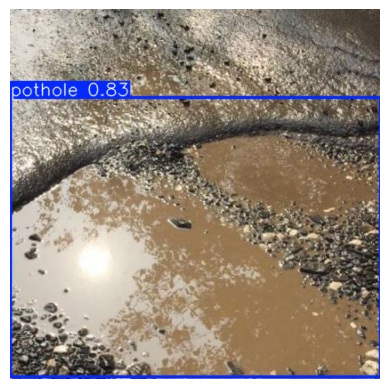

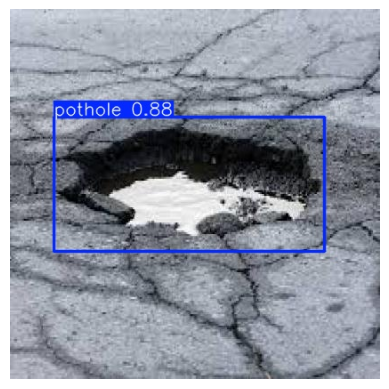

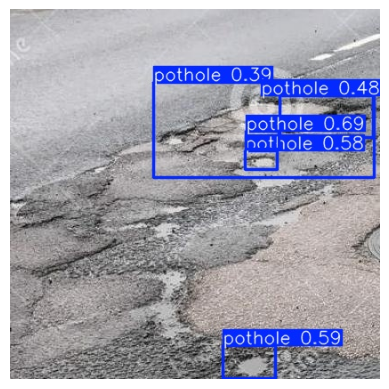

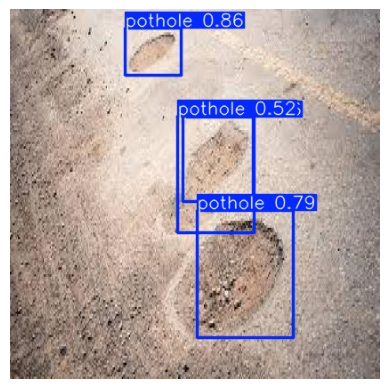

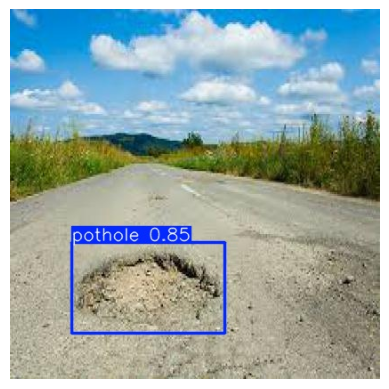

...

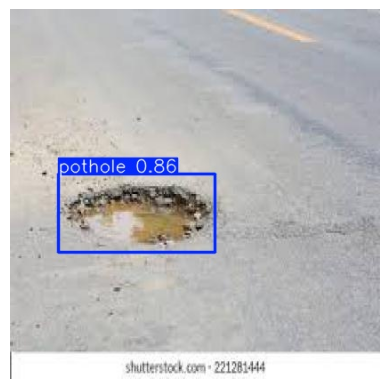

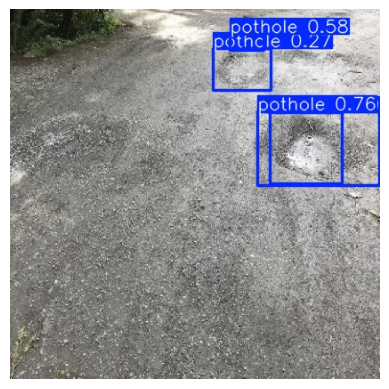

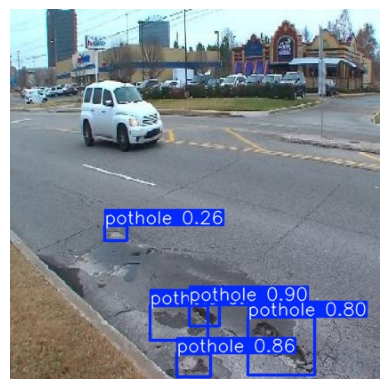

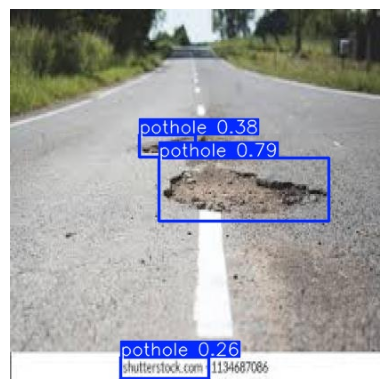

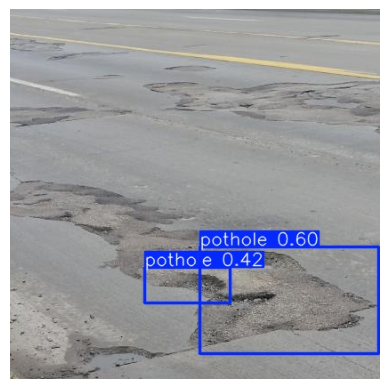

In [ ]:
for img_file in image_files:
    img = cv2.imread(img_file)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()